<!-- Notebook title -->
# Title

# 1. Notebook Description

### 1.1 Task Description
<!-- 
- A brief description of the problem you're solving with machine learning.
- Define the objective (e.g., classification, regression, clustering, etc.).
-->

TODO

### 1.2 Useful Resources
<!--
- Links to relevant papers, articles, or documentation.
- Description of the datasets (if external).
-->

### 1.2.1 Data

#### 1.2.1.1 Common

* [Datasets Kaggle](https://www.kaggle.com/datasets)  
  &nbsp;&nbsp;&nbsp;&nbsp;A vast repository of datasets across various domains provided by Kaggle, a platform for data science competitions.
  
* [Toy datasets from Sklearn](https://scikit-learn.org/stable/datasets/toy_dataset.html)  
  &nbsp;&nbsp;&nbsp;&nbsp;A collection of small datasets that come with the Scikit-learn library, useful for quick prototyping and testing algorithms.
  
* [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/index.php)  
  &nbsp;&nbsp;&nbsp;&nbsp;A widely-used repository for machine learning datasets, with a variety of real-world datasets available for research and experimentation.
  
* [Google Dataset Search](https://datasetsearch.research.google.com/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A tool from Google that helps to find datasets stored across the web, with a focus on publicly available data.
  
* [AWS Public Datasets](https://registry.opendata.aws/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A registry of publicly available datasets that can be analyzed on the cloud using Amazon Web Services (AWS).
  
* [Microsoft Azure Open Datasets](https://azure.microsoft.com/en-us/services/open-datasets/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A collection of curated datasets from various domains, made available by Microsoft Azure for use in machine learning and analytics.
  
* [Awesome Public Datasets](https://github.com/awesomedata/awesome-public-datasets)  
  &nbsp;&nbsp;&nbsp;&nbsp;A GitHub repository that lists a wide variety of datasets across different domains, curated by the community.
  
* [Data.gov](https://www.data.gov/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A portal to the US government's open data, offering access to a wide range of datasets from various federal agencies.
  
* [Google BigQuery Public Datasets](https://cloud.google.com/bigquery/public-data)  
  &nbsp;&nbsp;&nbsp;&nbsp;Public datasets hosted by Google BigQuery, allowing for quick and powerful querying of large datasets in the cloud.
  
* [Papers with Code](https://paperswithcode.com/datasets)  
  &nbsp;&nbsp;&nbsp;&nbsp;A platform that links research papers with the corresponding code and datasets, helping researchers reproduce results and explore new data.
  
* [Zenodo](https://zenodo.org/)  
  &nbsp;&nbsp;&nbsp;&nbsp;An open-access repository that allows researchers to share datasets, software, and other research outputs, often linked to academic publications.
  
* [The World Bank Open Data](https://data.worldbank.org/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A comprehensive source of global development data, with datasets covering various economic and social indicators.
  
* [OpenML](https://www.openml.org/)  
  &nbsp;&nbsp;&nbsp;&nbsp;An online platform for sharing datasets, machine learning experiments, and results, fostering collaboration in the ML community.
  
* [Stanford Large Network Dataset Collection (SNAP)](https://snap.stanford.edu/data/)  
  &nbsp;&nbsp;&nbsp;&nbsp;A collection of large-scale network datasets from Stanford University, useful for network analysis and graph-based machine learning.
  
* [KDnuggets Datasets](https://www.kdnuggets.com/datasets/index.html)  
  &nbsp;&nbsp;&nbsp;&nbsp;A curated list of datasets for data mining and data science, compiled by the KDnuggets community.


#### 1.2.1.2 Project

### 1.2.2 Learning

* [K-Nearest Neighbors on Kaggle](https://www.kaggle.com/code/mmdatainfo/k-nearest-neighbors)

* [Complete Guide to K-Nearest-Neighbors](https://kevinzakka.github.io/2016/07/13/k-nearest-neighbor)

### 1.2.3 Documentation

---

# 2. Setup

## 2.1 Imports
<!--
- Import necessary libraries (e.g., `numpy`, `pandas`, `matplotlib`, `scikit-learn`, etc.).
-->

In [45]:
from ikt450.src.common_imports import *
from ikt450.src.config import get_paths
from ikt450.src.common_func import load_dataset, save_dataframe, ensure_dir_exists

import torch
import torchvision
import torchvision.transforms as transforms

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device


device(type='cuda')

## 2.2 Global Variables
<!--
- Define global constants, paths, and configuration settings used throughout the notebook.
-->

### 2.2.1 Paths

In [46]:
paths = get_paths()

### 2.2.2 Seed

In [47]:
RANDOM_SEED = 7

### 2.2.3 Split ratio

In [48]:
SPLITRATIO = 0.8

## 2.3 Function Definitions
<!--
- Define helper functions that will be used multiple times in the notebook.
- Consider organizing these into separate sections (e.g., data processing functions, model evaluation functions).
-->

# 4. Data Processing

In [49]:
import datetime
import torch
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image, to_tensor
from PIL import ImageDraw, ImageFont
import torchvision.datasets as datasets

# Mean and std for normalization
mean = [0.485, 0.456, 0.406]  # ImageNet mean
std = [0.229, 0.224, 0.225]   # ImageNet std

# Custom transformation to add a date stamp
from PIL import ImageDraw, ImageFont
import datetime
import torch
from torchvision.transforms.functional import to_pil_image, to_tensor

class AddDateStampTransform:
    def __init__(self):
        self.date = datetime.datetime.now().strftime("%B %d, %Y")

    def __call__(self, image_tensor):
        # Convert Tensor to PIL Image for adding text\


        image = to_pil_image(torch.clamp(image_tensor, 0, 1))  # Clamp values to [0, 1]
        image_org = image.copy()
        draw = ImageDraw.Draw(image)
        font = ImageFont.load_default()

        # Coordinates for the text position
        x, y = 10 , 10
        x, y = torch.randint(5, image.width - 100, (1,)).item(), torch.randint(5, image.height - 20, (1,)).item()

        # Draw the outline (black)
        outline_color = (0, 0, 0)
        for offset in [(-1, -1), (-1, 1), (1, -1), (1, 1)]:  # Four corners around the text
            draw.text((x + offset[0], y + offset[1]), self.date, font=font, fill=outline_color)

        # Draw the main text (white)
        draw.text((x, y), self.date, font=font, fill=(255, 255, 255))

        image = to_tensor(image)
        image_org = to_tensor(image_org)

        diff = torch.abs(image - image_org)
        diff = torch.where(diff > 0.1, torch.tensor(1), diff)

        # where diff is 1, keep the original image, otherwise keep the stamped image
        image = torch.where(diff == 1, image, image_tensor)



        # Convert back to Tensor
        return image, image_tensor


# Define the common transformation sequence without adding the date stamp
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(256),        # Randomly crop the image to 224x224
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
    transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
        brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

test_transform = transforms.Compose([
    transforms.RandomResizedCrop(256),        # Randomly crop the image to 224x224
  #  transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
  #  transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
   # transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
    #    brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    #),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

# Custom dataset to apply transformations separately for the stamped and non-stamped versions
class StampedImageDataset(torch.utils.data.Dataset):
    def __init__(self, root, base_transform, stamp_transform=None):
        self.dataset = datasets.ImageFolder(root=root)
        self.base_transform = base_transform
        self.stamp_transform = stamp_transform if stamp_transform else lambda x: x

    def __getitem__(self, index):
        # Load image and apply base transformation
        img, label = self.dataset[index]
        transformed_img = self.base_transform(img)
        
        # Create stamped image by applying the stamp transformation
        stamped_img,transformed_img = self.stamp_transform(transformed_img.clone())
        
        return stamped_img, transformed_img, label

    def __len__(self):
        return len(self.dataset)

# Initialize dataset with stamping transformation
train_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/training",
    base_transform=train_transform,
    stamp_transform=AddDateStampTransform()
)

val_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/validation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)

test_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/evaluation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)
# make subselt of dataset
train_dataset = torch.utils.data.Subset(train_dataset, range(0, 1000))
# You can load it into a DataLoader as usual
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)


In [50]:

# Load and display image from dataloader


---

# 5. Model Development

In [51]:
# display the original image and the reconstructed image
#  and display the difference between the original and the reconstructed image

def display_images(original, reconstructed):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
    for ax in axes:
        ax.axis("off")
    # denormalize images
    original=original.to("cpu") 
    reconstructed = reconstructed.to("cpu")
    mean = [0.485, 0.456, 0.406]  # ImageNet mean
    std = [0.229, 0.224, 0.225]   # ImageNet std
    mean = torch.tensor(mean).to(original.device)
    std = torch.tensor(std).to(original.device)
    print(original.device)
    original = original * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
    reconstructed = reconstructed * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)

    
    axes[0].imshow(original.permute(1, 2, 0))
    axes[0].set_title("Original")
    
    axes[1].imshow(reconstructed.permute(1, 2, 0))
    axes[1].set_title("Reconstructed")
    
    diff = torch.abs(original - reconstructed)
    axes[2].imshow(diff.permute(1, 2, 0))
    axes[2].set_title("Difference")
    
    plt.tight_layout()
    plt.show()




In [52]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
import numpy as np
import matplotlib.pyplot as plt

# UNet-like architecture for the diffusion model


# Smaller UNet-like architecture for the diffusion model


# Smaller UNet-like architecture with additional activation functions
class SmallUNet(nn.Module):
    def __init__(self):
        super(SmallUNet, self).__init__()
        # Encoder layers
        self.enc1 = self.conv_block(3, 32)
        self.enc2 = self.conv_block(32, 64)
        
        # Bottleneck
        self.bottleneck = self.conv_block(64, 128)
        
        # Decoder layers
        self.dec2 = self.conv_block(128 + 64, 64)
        self.dec1 = self.conv_block(64 + 32, 32)
        
        # Final layer with activation function
        self.final = nn.Sequential(
            nn.Conv2d(32, 3, kernel_size=1),
           # Ensure output is between 0 and 1
        )

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoding path
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, 2))
        
        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc2, 2))
        
        # Decoding path
        dec2 = F.interpolate(bottleneck, scale_factor=2, mode='nearest')
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = F.interpolate(dec2, scale_factor=2, mode='nearest')
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.dec1(dec1)
        
        return self.final(dec1)

# The rest of the training code remains the same as in the previous implementation


# The rest of the training code remains the same as in the previous implementation

# Diffusion forward process (adding noise)
def add_noise(image, noise_level):
    noise = torch.randn_like(image) * noise_level
    noisy_image = image + noise
    return torch.clamp(noisy_image, -1, 1.0)

# Diffusion reverse process (training step)
def train_step(model, clean_images, images_with_stamps, optimizer, criterion):
    model.train()
    optimizer.zero_grad()
    
    # Add noise to images with date stamps (simulate systematic noise)
    noise_level = 0.1  # Adjust noise level as needed
    noisy_images = add_noise(images_with_stamps, noise_level)
    
    # Predict cleaned image
    predicted_clean_image = model(noisy_images)
    
    # Calculate loss between the predicted clean image and the true clean image
    loss = criterion(predicted_clean_image, clean_images)
    loss.backward()
    optimizer.step()
    
    return loss.item()


In [53]:

# Hyperparameters and setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SmallUNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.MSELoss()
epochs = 10


In [54]:
device

device(type='cuda')

In [55]:

# Sample training loop
for epoch in range(epochs):
    model.train()
    train_loss = 0
    for clean_images, images_with_stamps, _ in train_loader:  # Ensure train_loader returns both sets
        clean_images = clean_images.to(device)
        images_with_stamps = images_with_stamps.to(device)
        
        loss = train_step(model, clean_images, images_with_stamps, optimizer, criterion)
        train_loss += loss


    
    # evaluate the model
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}")
    model.eval()

    with torch.no_grad():
        total_loss = 0
        noise_level = 0.1
        for clean_images, images_with_stamps, _ in val_loader:
            clean_images = clean_images.to(device)
            images_with_stamps = images_with_stamps.to(device)
            noisy_images = add_noise(images_with_stamps, noise_level)
            predicted_clean_image = model(noisy_images)
            loss = criterion(predicted_clean_image, clean_images)
            total_loss += loss.item()
        
        print(f"Epoch [{epoch+1}/{epochs}], eval Loss: {total_loss:.4f}")
    


print("Training complete.")


Epoch [1/10], Loss: 43.7393
Epoch [1/10], eval Loss: 128.1799
Epoch [2/10], Loss: 27.0265
Epoch [2/10], eval Loss: 45.1014
Epoch [3/10], Loss: 10.5627
Epoch [3/10], eval Loss: 24.5532
Epoch [4/10], Loss: 8.0076
Epoch [4/10], eval Loss: 19.6207
Epoch [5/10], Loss: 6.8637
Epoch [5/10], eval Loss: 17.5920
Epoch [6/10], Loss: 5.9045
Epoch [6/10], eval Loss: 15.8951
Epoch [7/10], Loss: 5.2144
Epoch [7/10], eval Loss: 15.1475
Epoch [8/10], Loss: 4.8117
Epoch [8/10], eval Loss: 14.8929
Epoch [9/10], Loss: 4.4977
Epoch [9/10], eval Loss: 14.5028
Epoch [10/10], Loss: 4.2416
Epoch [10/10], eval Loss: 13.1024
Training complete.


C:\Users\jonin\AppData\Local\Temp\ipykernel_64536\2589707804.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  original = original * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
C:\Users\jonin\AppData\Local\Temp\ipykernel_64536\2589707804.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  reconstructed = reconstructed * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26476678..1.1411207].


cpu


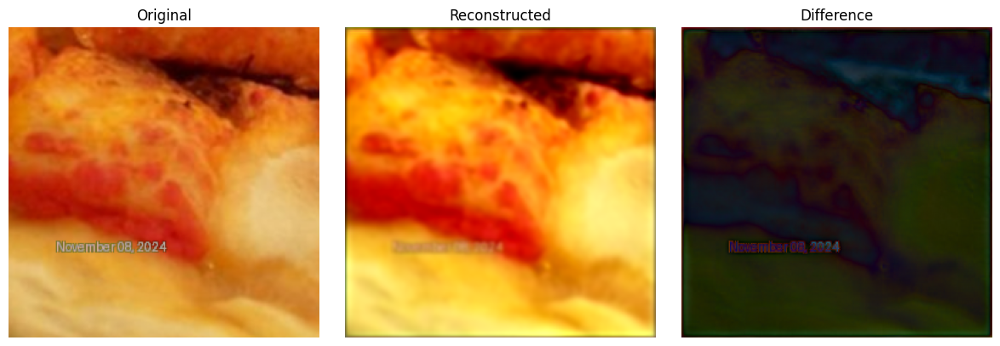

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14491168..1.4446608].


cpu


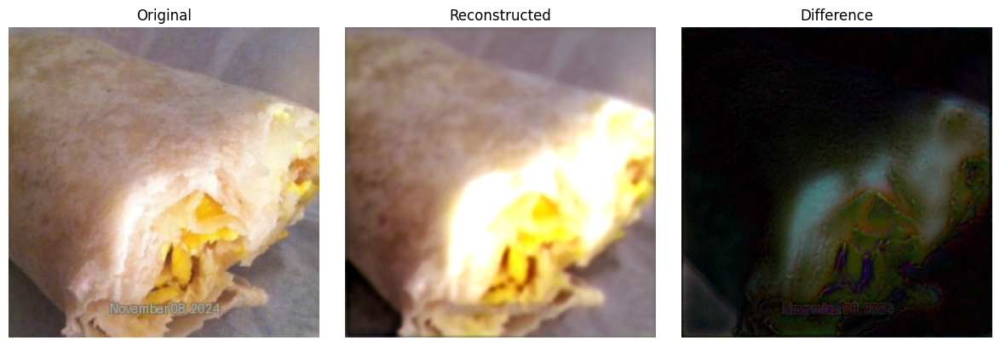

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08895075..1.1094936].


cpu


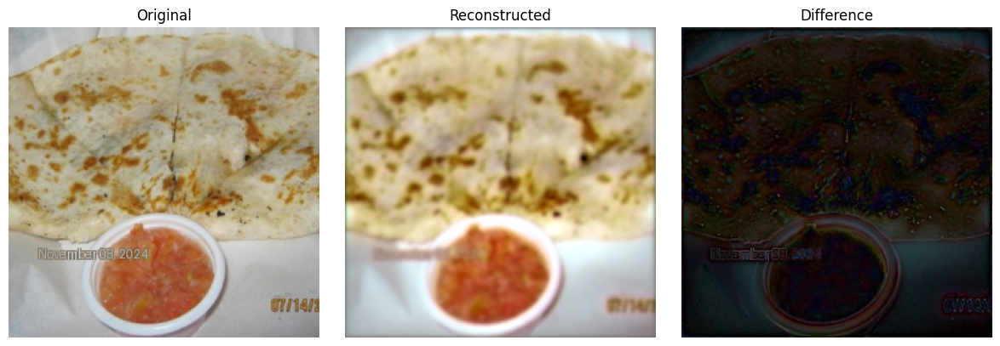

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22811368..0.8404108].


cpu


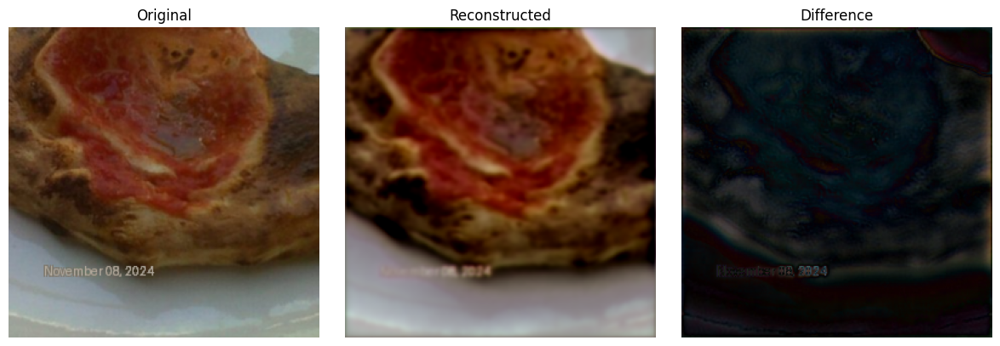

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30123946..1.1405339].


cpu


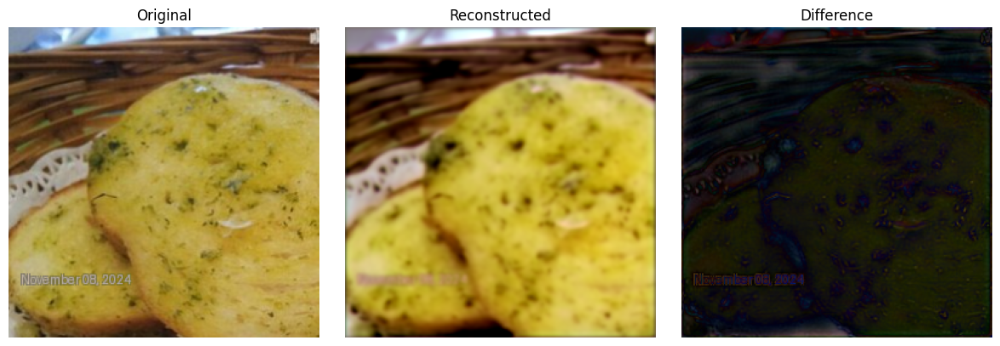

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13563755..0.8089308].


cpu


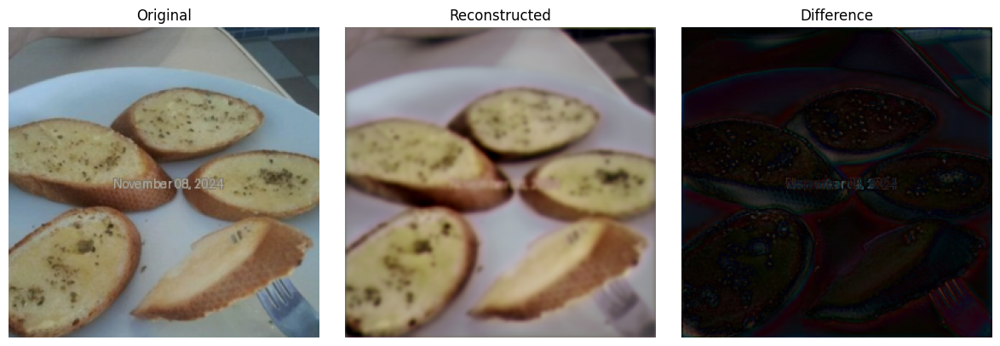

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.56156313..1.457062].


cpu


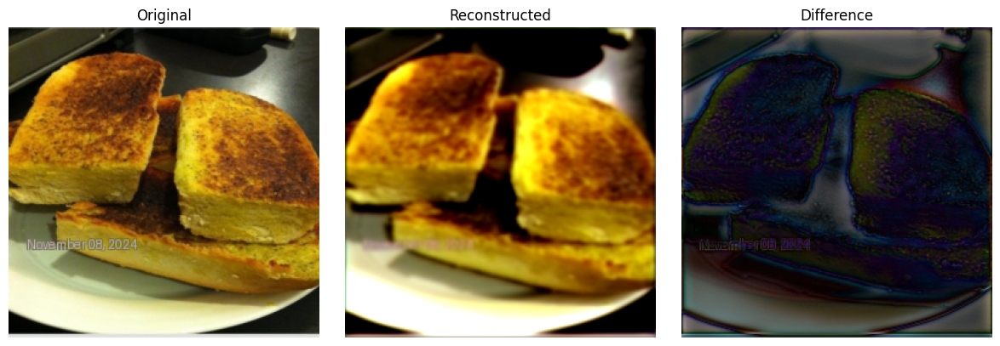

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.52325654..1.3044171].


cpu


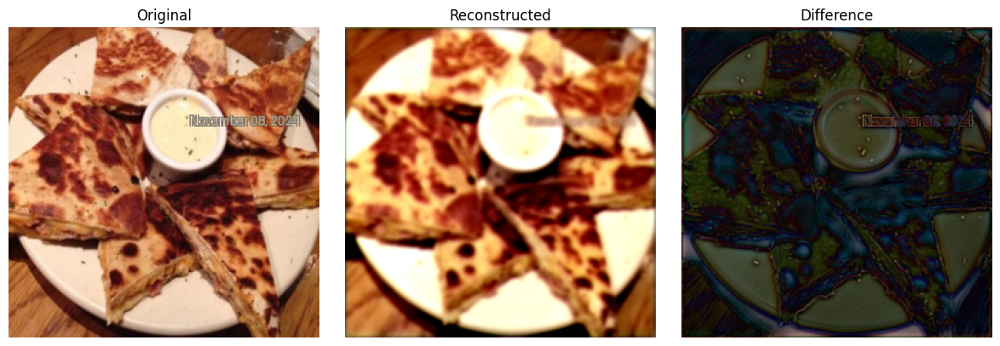

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30176568..0.76242733].


cpu


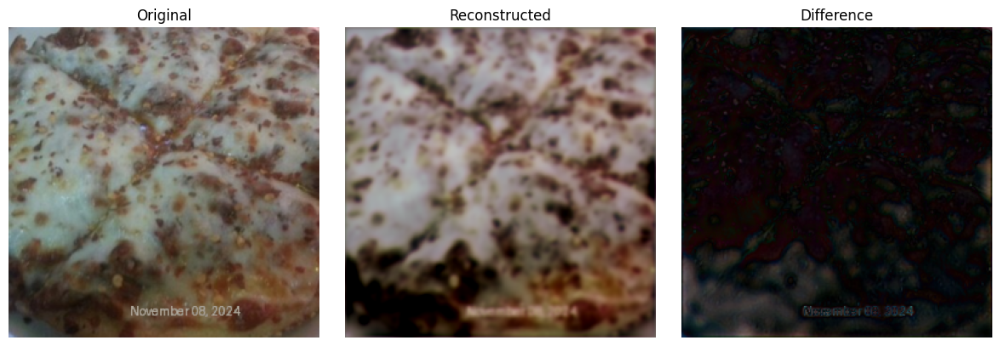

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5025032..1.4062812].


cpu


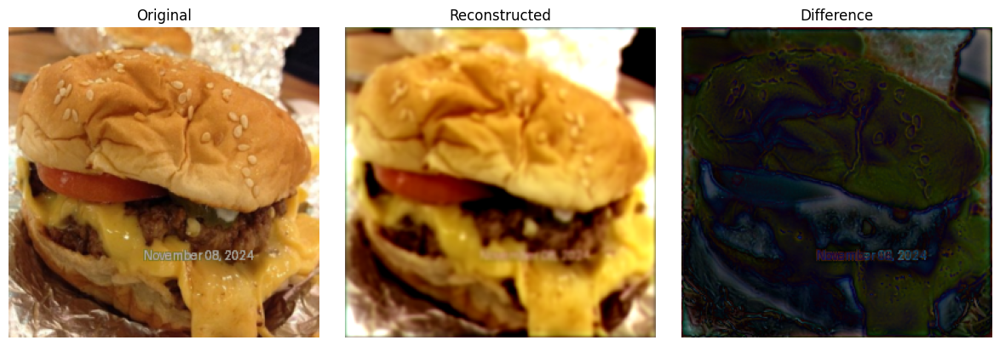

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.54107463..0.7433374].


cpu


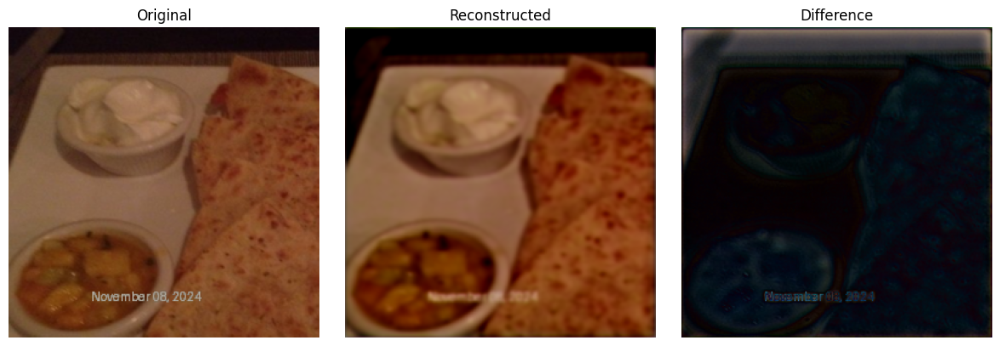

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29551825..1.3092635].


cpu


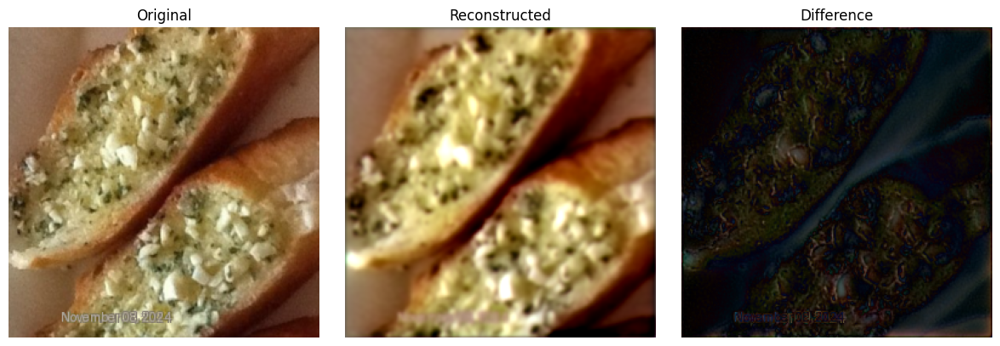

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3625718..1.2947252].


cpu


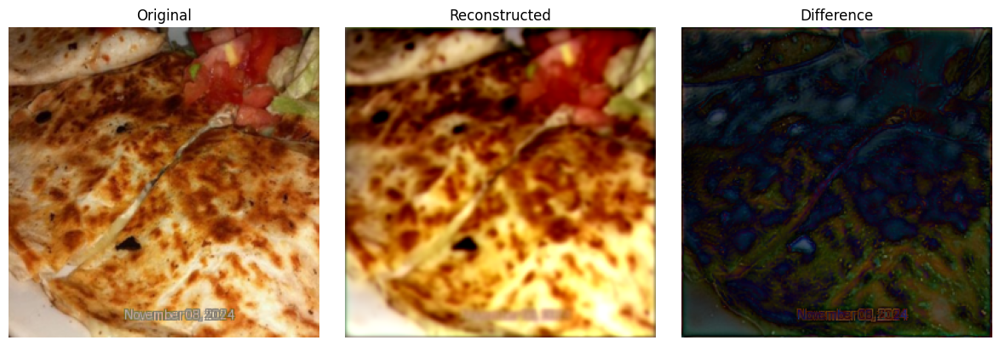

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46677995..1.0838563].


cpu


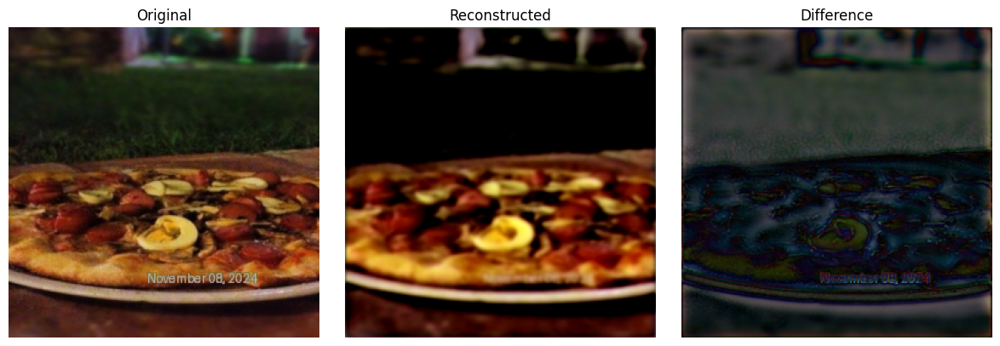

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20242453..1.295775].


cpu


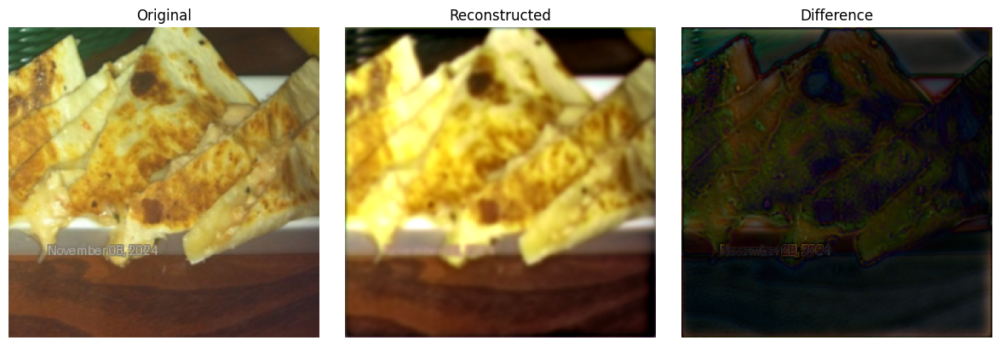

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11651155..0.99555355].


cpu


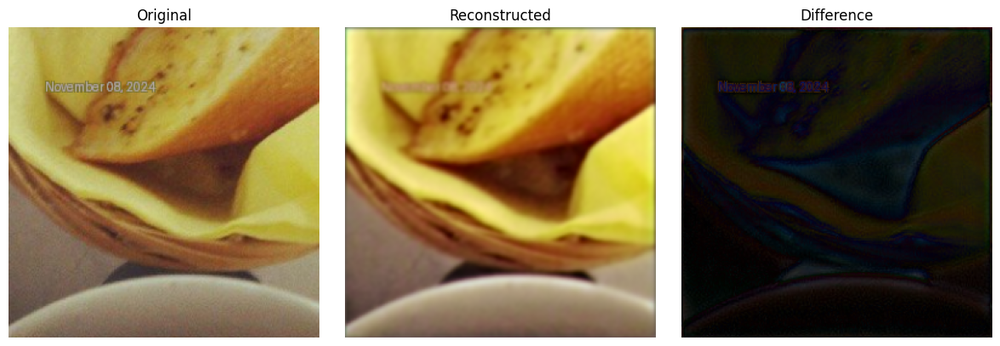

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5293542..1.4416804].


cpu


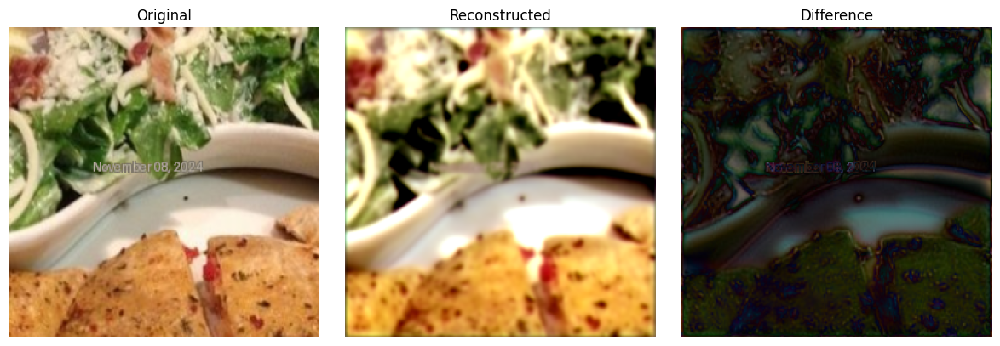

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6047571..1.4376597].


cpu


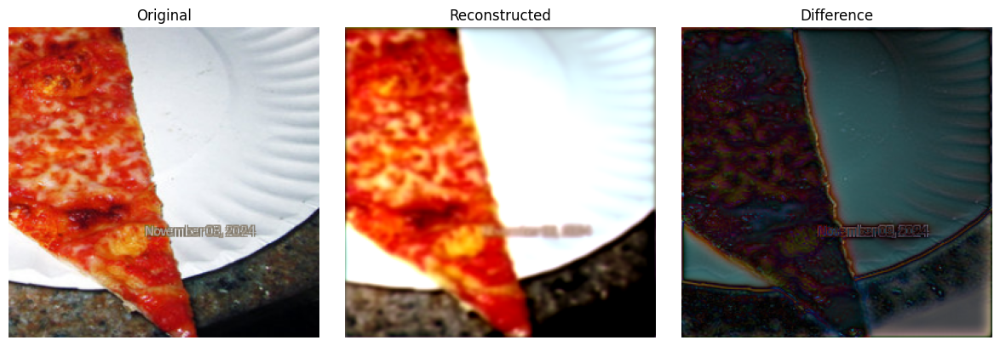

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30969056..1.0315273].


cpu


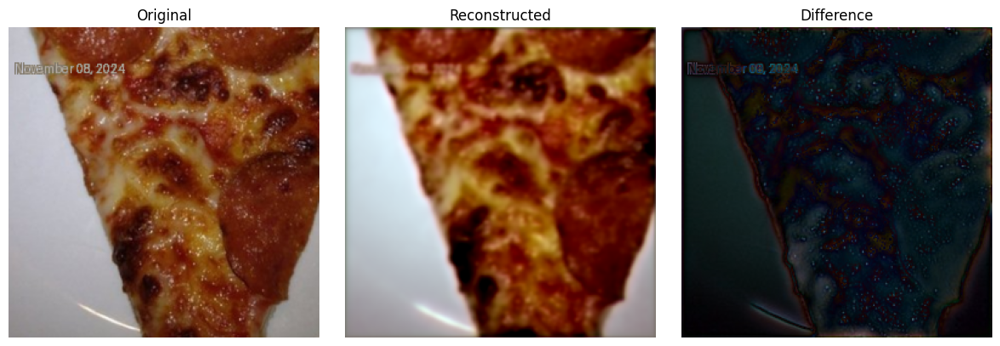

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0038408935..1.4120203].


cpu


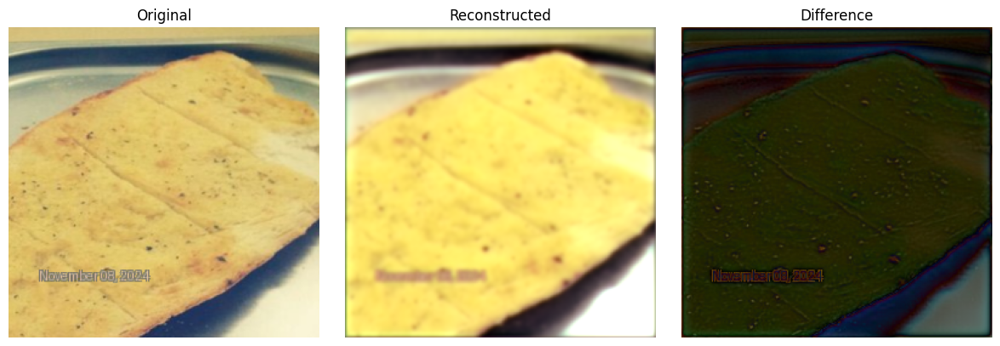

In [65]:
# Set the model to evaluation mode
model.eval()

# Get a batch of data from the test loader
data_iter = iter(val_loader)
stamped_images, base_images, _ = next(data_iter)
stamped_images = stamped_images.to(device)
base_images = base_images.to(device)

# Perform inference with the diffusion model
with torch.no_grad():
      # Start with the original stamped images
    num_steps = 1  # Number of iterative denoising steps
    
   
        # Pass through the model to progressively denoise
    noise_level = 0.1
    #noisy_images = add_noise(images_with_stamps, noise_level)
    

    outputs = model(stamped_images)


# Display the first 20 results
for i in range(min(20, len(stamped_images))):
    display_images(stamped_images[i], outputs[i])


## 5.1 Model Selection
<!--
- Choose the model(s) to be trained (e.g., linear regression, decision trees, neural networks).
-->

## 5.2 Model Training
<!--
- Train the selected model(s) using the training data.
-->

## 5.3 Model Evaluation
<!--
- Evaluate model performance on validation data.
- Use appropriate metrics (e.g., accuracy, precision, recall, RMSE).
-->

## 5.4 Hyperparameter Tuning
<!--
- Fine-tune the model using techniques like Grid Search or Random Search.
- Evaluate the impact of different hyperparameters.
-->

## 5.5 Model Testing
<!--
- Evaluate the final model on the test dataset.
- Ensure that the model generalizes well to unseen data.
-->

## 5.6 Model Interpretation (Optional)
<!--
- Interpret the model results (e.g., feature importance, SHAP values).
- Discuss the strengths and limitations of the model.
-->

---

# 6. Predictions


## 6.1 Make Predictions
<!--
- Use the trained model to make predictions on new/unseen data.
-->

## 6.2 Save Model and Results
<!--
- Save the trained model to disk for future use.
- Export prediction results for further analysis.
-->

---

# 7. Documentation and Reporting

## 7.1 Summary of Findings
<!--
- Summarize the results and findings of the analysis.
-->

## 7.2 Next Steps
<!--
- Suggest further improvements, alternative models, or future work.
-->

## 7.3 References
<!--
- Cite any resources, papers, or documentation used.
-->